In [1]:
import sys
sys.path.append('..')
sys.path.append("..")
sys.path.append("../dl")

import torch
import segmentation_models_pytorch as smp
from omegaconf import OmegaConf
from torch import nn

from config import conf
from inferer import *
from lightning_model import *

/home/leos/.local/lib/python3.6/site-packages/pandas/compat/_optional.py:106: UserWarning: Pandas requires version '1.2.1' or newer of 'bottleneck' (version '1.2.0' currently installed).
  warnings.warn(msg, UserWarning)
/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192

/usr/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning:

can't resolve package from 

In [2]:
model = smp.FPN(
    encoder_name="resnext50_32x4d",
    classes=2,
    decoder_merge_policy='cat'
)

PATH = Path(conf['paths']['experiment_root_dir'])
PATH = PATH.joinpath((f"{conf['training_args']['model_name']}/"
                      f"version_{conf['training_args']['experiment_version']}"))
PATH = PATH.joinpath(f"last.ckpt")

segmodel = SegModel.from_conf(model, conf)
checkpoint = torch.load(PATH, map_location = lambda storage, loc : storage)
segmodel.load_state_dict(checkpoint['state_dict'])

<All keys matched successfully>

In [3]:
inf = Inferer.from_conf(segmodel, conf)

In [4]:
infobj = inf.run()

Prediction for: TCGA-2Z-A9J9-01A-01-TS1


/home/leos/.local/lib/python3.6/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function extract_patches is deprecated; The function feature_extraction.image.extract_patches has been deprecated in 0.22 and will be removed in 0.24.



Prediction for: TCGA-44-2665-01B-06-BS6
Prediction for: TCGA-69-7764-01A-01-TS1
Prediction for: TCGA-A6-6782-01A-01-BS1
Prediction for: TCGA-AC-A2FO-01A-01-TS1
Prediction for: TCGA-AO-A0J2-01A-01-BSA
Prediction for: TCGA-CU-A0YN-01A-02-BSB
Prediction for: TCGA-EJ-A46H-01A-03-TSC
Prediction for: TCGA-FG-A4MU-01B-01-TS1
Prediction for: TCGA-GL-6846-01A-01-BS1
Prediction for: TCGA-HC-7209-01A-01-TS1
Prediction for: TCGA-HT-8564-01Z-00-DX1
Prediction for: TCGA-IZ-8196-01A-01-BS1
Prediction for: TCGA-ZF-A9R5-01A-01-TS1


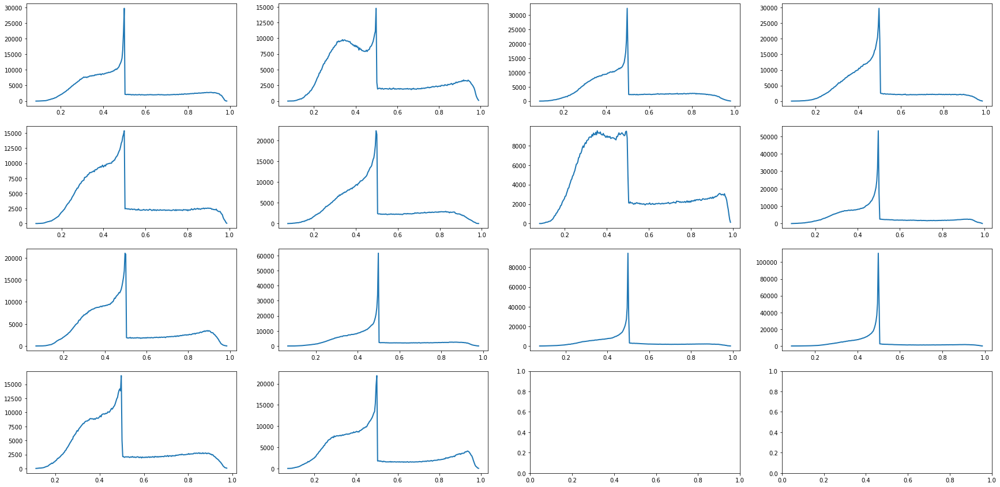

In [5]:
inf.plot_histograms()

In [6]:
# inf.save_outputs('pöö/pö/pöö/image.png')

In [7]:
# inf.plot_predictions()

In [8]:
inf.post_process()

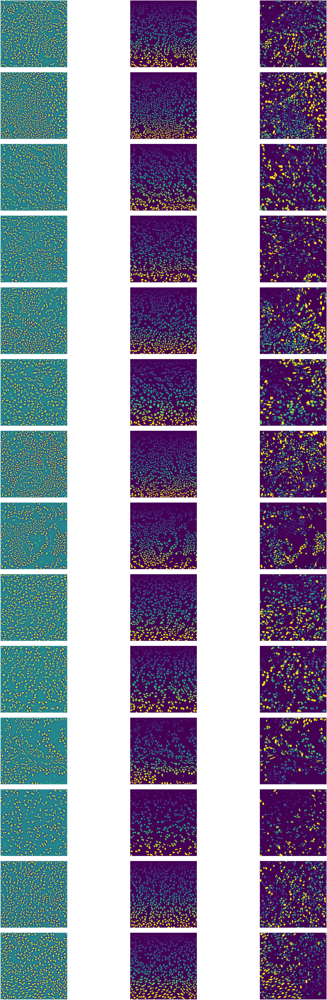

In [9]:
inf.plot_segmentations()

In [10]:
inf.benchmark()

,AJI,AJI plus,DICE2,PQ,SQ,DQ,inst Sensitivity,inst Precision,splits,merges
TCGA-2Z-A9J9-01A-01-TS1_metrics,0.596346,0.603152,0.775519,0.572753,0.719448,0.796101,0.852174,0.746951,0.961555,0.769703
TCGA-44-2665-01B-06-BS6_metrics,0.628060,0.638444,0.759549,0.625017,0.713438,0.876063,0.881418,0.870773,0.640182,1.187046
TCGA-69-7764-01A-01-TS1_metrics,0.589177,0.589048,0.783495,0.562463,0.733894,0.766409,0.900227,0.667227,0.997038,0.753169
TCGA-A6-6782-01A-01-BS1_metrics,0.534534,0.550972,0.735150,0.532226,0.724624,0.734486,0.818594,0.666052,1.014950,0.472074
TCGA-AC-A2FO-01A-01-TS1_metrics,0.539483,0.541984,0.710407,0.507316,0.671691,0.755282,0.823417,0.697561,0.906169,1.254131
TCGA-AO-A0J2-01A-01-BSA_metrics,0.604663,0.609450,0.770434,0.549185,0.716445,0.766542,0.862360,0.689888,0.879641,0.821021
TCGA-CU-A0YN-01A-02-BSB_metrics,0.602732,0.605710,0.791356,0.593130,0.725278,0.817797,0.855244,0.783491,0.881196,0.955476
TCGA-EJ-A46H-01A-03-TSC_metrics,0.574101,0.578802,0.772942,0.573714,0.728603,0.787417,0.886266,0.708405,0.905461,0.530597
TCGA-FG-A4MU-01B-01-TS1_metrics,0.652231,0.658511,0.777986,0.609873,0.743283,0.820513,0.860215,0.784314,0.736422,0.711169
TCGA-GL-6846-01A-01-BS1_metrics,0.668903,0.669028,0.783265,0.640387,0.762697,0.839635,0.907042,0.781553,0.709750,0.597640


In [11]:
#from scipy.ndimage import gaussian_filter
#from skimage import data
#from skimage import img_as_float
#from skimage.morphology import reconstruction
#from skimage.segmentation import morphological_chan_vese, morphological_geodesic_active_contour, checkerboard_level_set
#
#gt = scipy.io.loadmat(inf.gt_masks[13])['inst_map']
#f = list(inf.soft_maps.values())[26]
#fn = list(inf.soft_maps.keys())[26]
#print(fn)
#
#hist2, hist_centers2 = histogram(f)
#d2 = np.diff(hist2)
#b2 = d2 == np.min(d2)
#b2 = np.append(b2, False) # append one ince np.diff loses one element in arr
#thresh2 = hist_centers2[b2] + 0.1
#
#mask2 = naive_thresh_logits(f, thresh2)
#mask2 = inv_dist_watershed(mask2)
#print(PQ(remap_label(gt), remap_label(mask2)))
#
#fig, ax = plt.subplots(2,2, figsize=(40,20))
#ax = ax.flatten()
#ax[0].imshow(f)
#ax[1].plot(hist_centers2, hist2, lw=2)
#ax[2].imshow(mask2)
#a#x[3].imshow(gt)